In [1]:
from pyspark.sql import SparkSession
import pyspark.sql.functions as sfn
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, LongType, BooleanType
from pyspark import StorageLevel

In [3]:
spark = SparkSession \
    .builder \
    .appName("Final project") \
    .config("spark.dynamicAllocation.enabled", "true") \
    .config("spark.executor.memory", "10g") \
    .config("spark.executor.cores", "10") \
    .getOrCreate()

24/06/08 12:38:59 WARN Utils: Your hostname, arch resolves to a loopback address: 127.0.1.1; using 192.168.1.39 instead (on interface enp3s0)
24/06/08 12:38:59 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/06/08 12:39:01 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [4]:
joined_df = spark.read.parquet("datasets/processed/joined_df.parquet")
joined_df.persist(StorageLevel.MEMORY_AND_DISK)
joined_df.printSchema()

root
 |-- name: string (nullable = true)
 |-- track_name: string (nullable = true)
 |-- popularity: long (nullable = true)
 |-- duration_ms: long (nullable = true)
 |-- explicit: boolean (nullable = true)
 |-- danceability: double (nullable = true)
 |-- energy: double (nullable = true)
 |-- key: long (nullable = true)
 |-- loudness: double (nullable = true)
 |-- mode: long (nullable = true)
 |-- speechiness: double (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- instrumentalness: double (nullable = true)
 |-- liveness: double (nullable = true)
 |-- valence: double (nullable = true)
 |-- tempo: double (nullable = true)
 |-- time_signature: long (nullable = true)
 |-- track_genre: string (nullable = true)
 |-- country: string (nullable = true)



In [5]:
antijoined_df = spark.read.parquet("datasets/processed/antijoined_df.parquet")
antijoined_df.persist(StorageLevel.MEMORY_AND_DISK)
antijoined_df.printSchema()

root
 |-- name: string (nullable = true)
 |-- track_name: string (nullable = true)
 |-- popularity: long (nullable = true)
 |-- duration_ms: long (nullable = true)
 |-- explicit: boolean (nullable = true)
 |-- danceability: double (nullable = true)
 |-- energy: double (nullable = true)
 |-- key: long (nullable = true)
 |-- loudness: double (nullable = true)
 |-- mode: long (nullable = true)
 |-- speechiness: double (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- instrumentalness: double (nullable = true)
 |-- liveness: double (nullable = true)
 |-- valence: double (nullable = true)
 |-- tempo: double (nullable = true)
 |-- time_signature: long (nullable = true)
 |-- track_genre: string (nullable = true)



In [8]:
songs_per_country = joined_df.groupBy("country").count().toPandas()
songs_per_country = songs_per_country.sort_values(by="count", ascending=False)

In [9]:
songs_per_country_filtered = songs_per_country[songs_per_country["count"] > 50]

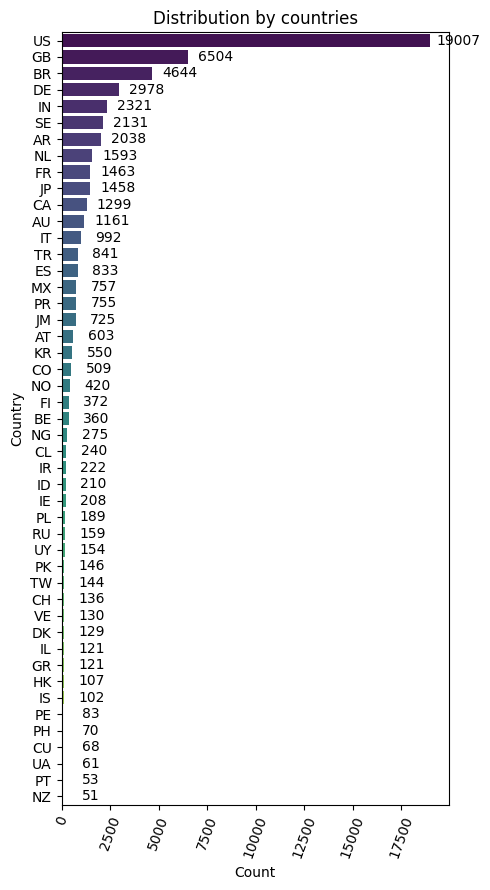

In [32]:
plt.figure(figsize=(5, 9))
sns.barplot(x="count", y="country", data=songs_per_country_filtered, palette="viridis", hue="country")
plt.title("Distribution by countries")

plt.xticks(rotation=70)

plt.xlabel("Count")
plt.ylabel("Country")

for p in plt.gca().patches:
    plt.gca().annotate(format(p.get_width(), '.0f'),
                          (p.get_width(), p.get_y() + p.get_height() / 2),
                          ha = 'center', va = 'center',
                          xytext = (20, 0),
                          textcoords = 'offset points')

plt.tight_layout()

plt.show()

In [34]:
countries = [
    item["country"] for item in 
    joined_df \
        .groupBy("country") \
        .count() \
        .filter("count > 500") \
        .select("country") \
        .distinct() \
        .collect()
        ]

print(countries)

resampled_df = joined_df \
    .filter(sfn.col("country").isin(countries)) \
    .sampleBy(
        "country", 
        fractions = { 
                    country: 500 / joined_df \
                            .filter(joined_df.country == country) \
                            .count() \
                    for country in countries
                },
        seed=123456
    )

['NL', 'MX', 'AT', 'AU', 'CA', 'GB', 'BR', 'DE', 'ES', 'TR', 'KR', 'US', 'IN', 'JM', 'FR', 'IT', 'SE', 'JP', 'CO', 'AR', 'PR']


In [10]:
songs_per_country = resampled_df.groupBy("country").count().toPandas()
songs_per_country = songs_per_country.sort_values(by="count", ascending=False)

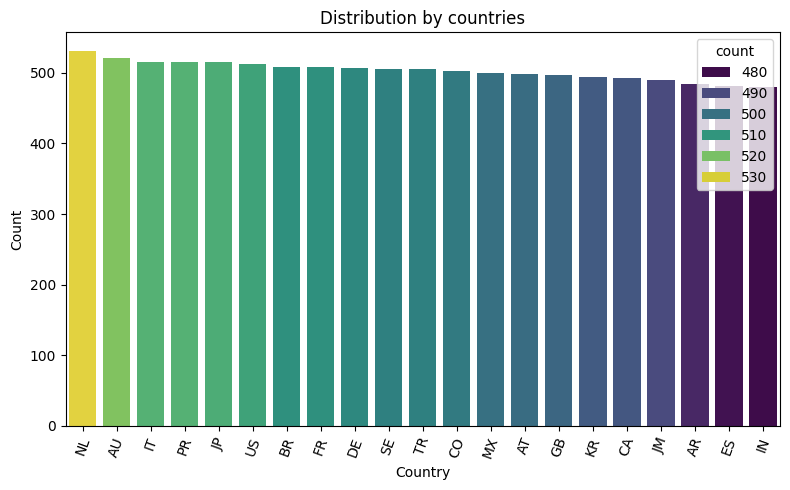

In [11]:
plt.figure(figsize=(8, 5))
sns.barplot(x="country", y="count", data=songs_per_country, palette="viridis", hue="count")
plt.title("Distribution by countries")

plt.xticks(rotation=70)

plt.xlabel("Country")
plt.ylabel("Count")

plt.tight_layout()

plt.show()

In [35]:
resampled_df.show(5)

+--------------+--------------------+----------+-----------+--------+------------+------+---+--------+----+-----------+------------+----------------+--------+-------+-------+--------------+-----------+-------+
|          name|          track_name|popularity|duration_ms|explicit|danceability|energy|key|loudness|mode|speechiness|acousticness|instrumentalness|liveness|valence|  tempo|time_signature|track_genre|country|
+--------------+--------------------+----------+-----------+--------+------------+------+---+--------+----+-----------+------------+----------------+--------+-------+-------+--------------+-----------+-------+
|    Amon Tobin|              Slowly|        49|     337506|   false|       0.575| 0.637|  1|  -8.874|   0|     0.0348|      0.0792|           0.911|   0.384|  0.122|136.025|             4|   trip-hop|     BR|
|   Arma Blanca|     Corazon y Mente|        26|     287013|   false|       0.735| 0.605|  4|   -10.1|   0|      0.333|      0.0669|             0.0|  0.0801|  

In [13]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import StringIndexer, VectorAssembler, QuantileDiscretizer
from pyspark.ml.classification import RandomForestClassifier, DecisionTreeClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

df = resampled_df.drop("track_id", "name", "track_name")


# Encode categorical columns using StringIndexer
genre_indexer = StringIndexer(inputCol="track_genre", outputCol="track_genre_index")
country_indexer = StringIndexer(inputCol="country", outputCol="country_index")

# Apply indexers
df = genre_indexer.fit(df).transform(df)
df = country_indexer.fit(df).transform(df).drop("track_genre", "country")

discretizer = QuantileDiscretizer(inputCol="track_genre_index", outputCol="track_genre_bucketed", numBuckets=32)
df = discretizer.fit(df).transform(df).drop("track_genre_index")

# VectorAssembler to combine feature columns into a single vector column
feature_columns = [col for col in df.columns if col not in ["country_index"]]
assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")

df = assembler.transform(df).select("features", "country_index")

# Split data into training and test sets
train_df, test_df = df.randomSplit([0.8, 0.2], seed=42)

# Initialize GBTClassifier
rf = RandomForestClassifier(labelCol="country_index", featuresCol="features", numTrees=100)

# Train the model
model = rf.fit(train_df)

# Make predictions
predictions = model.transform(test_df)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(labelCol="country_index", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print(f"Accuracy: {accuracy}")

24/06/07 17:18:02 WARN DAGScheduler: Broadcasting large task binary with size 1230.7 KiB
24/06/07 17:18:05 WARN DAGScheduler: Broadcasting large task binary with size 1534.7 KiB


Accuracy: 0.40356798457087756


In [36]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score

country_label_encoder = LabelEncoder()
genre_label_encoder = LabelEncoder()

df = resampled_df.drop("track_id", "name", "track_name", "country").toPandas()
df["track_genre"] = genre_label_encoder.fit_transform(df["track_genre"])
df["country"] = country_label_encoder.fit_transform(resampled_df.select("country").toPandas())

X = df.drop("country", axis=1)
y = df["country"]


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = XGBClassifier()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

/home/ferran/projects/bigdata-master/practoxa/venv/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.6934720908230843


In [96]:
shap_values = shap.TreeExplainer(model).shap_values(X_test)

In [93]:
shap_values[0].shape

(16, 21)

In [98]:
# Select an instance to explain
# instance_index = 0
# shap_value = shap_values[1]
# instance = X_test.iloc[instance_index]

# print(X_test.iloc[instance_index])

shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_value[..., 1], instance)

In [72]:
import shap
from shap import TreeExplainer, Explanation
from shap.plots import waterfall

In [80]:
shap_values = shap.TreeExplainer(model).shap_values(X_test)

In [117]:
X_test.to_csv("datasets/processed/X_test.csv", index=False)

Country: AR


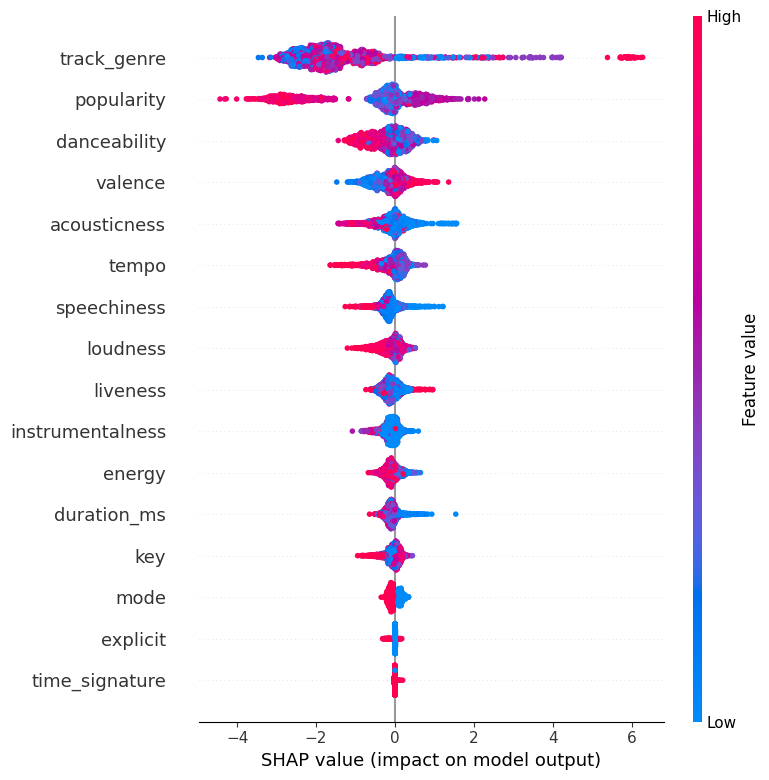

Country: AT


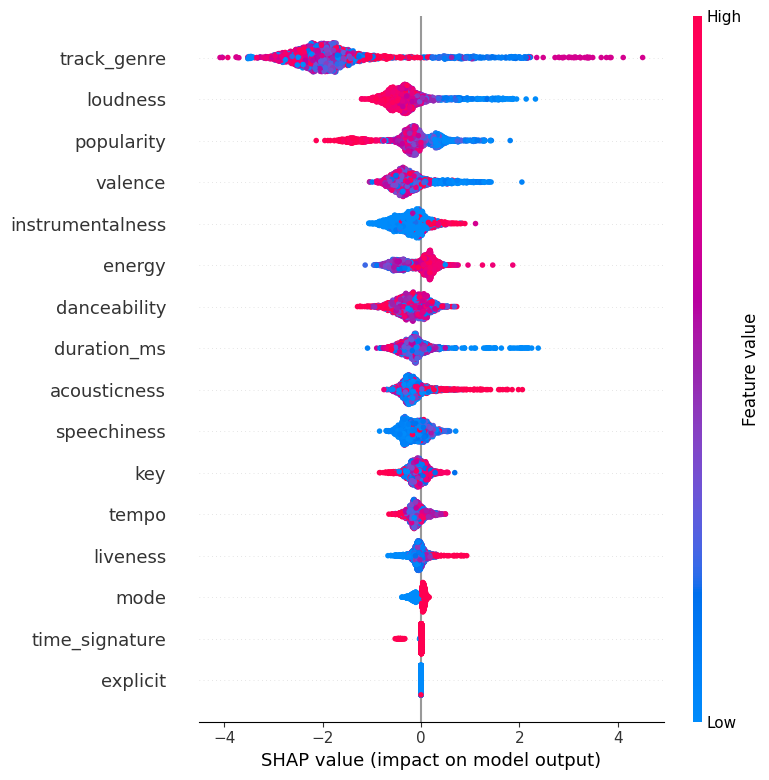

Country: AU


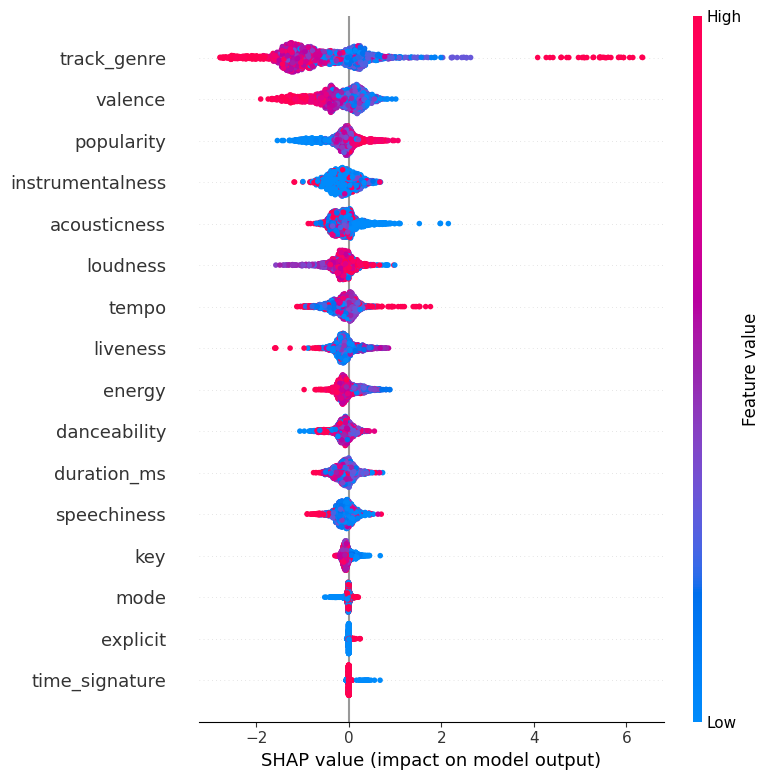

Country: BR


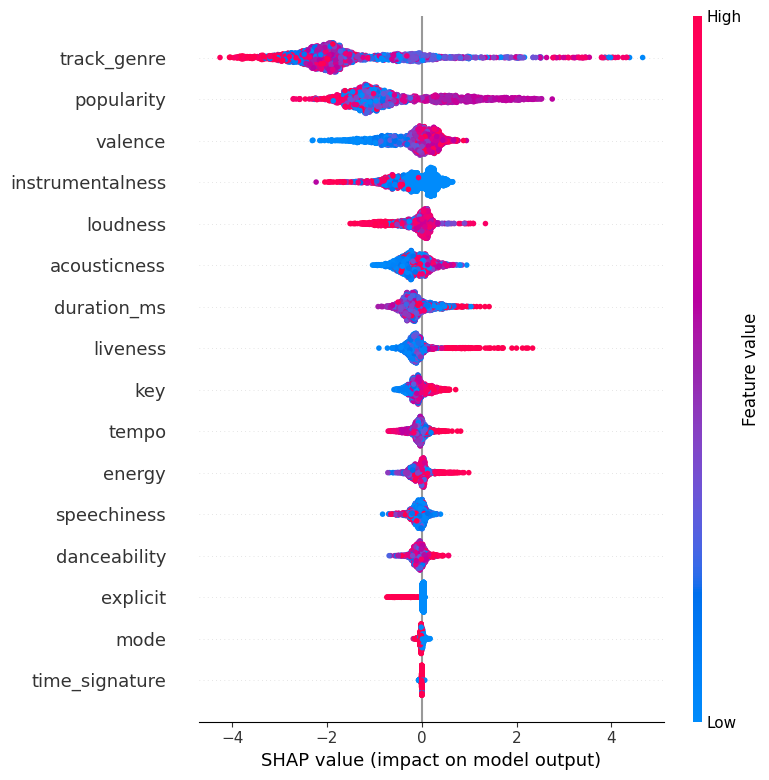

Country: CA


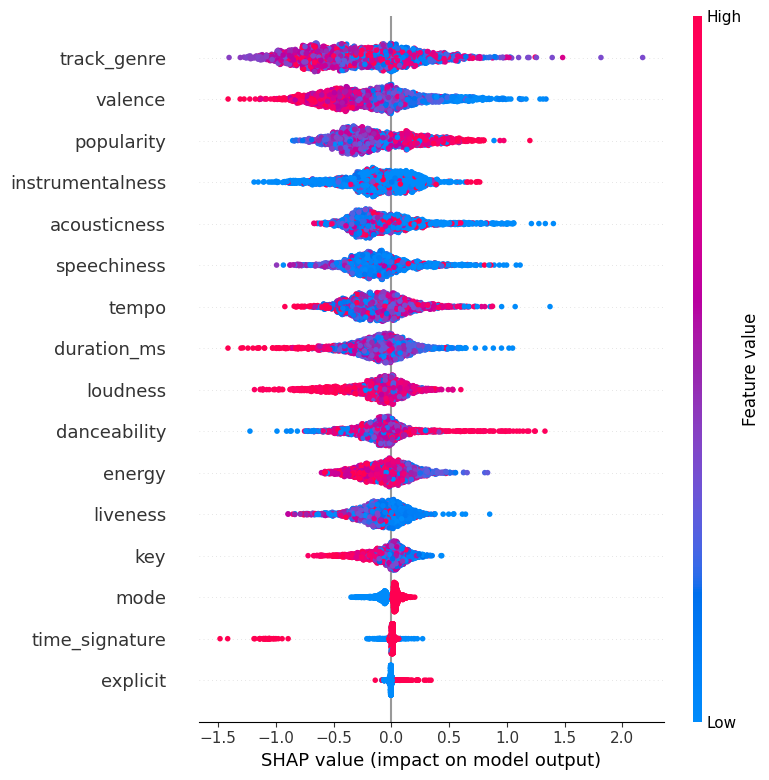

Country: CO


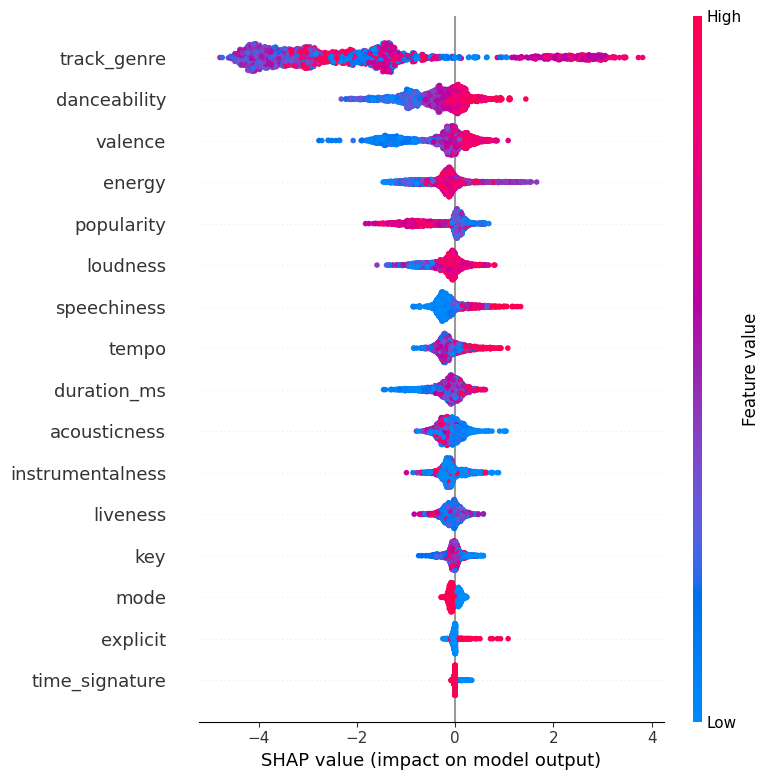

Country: DE


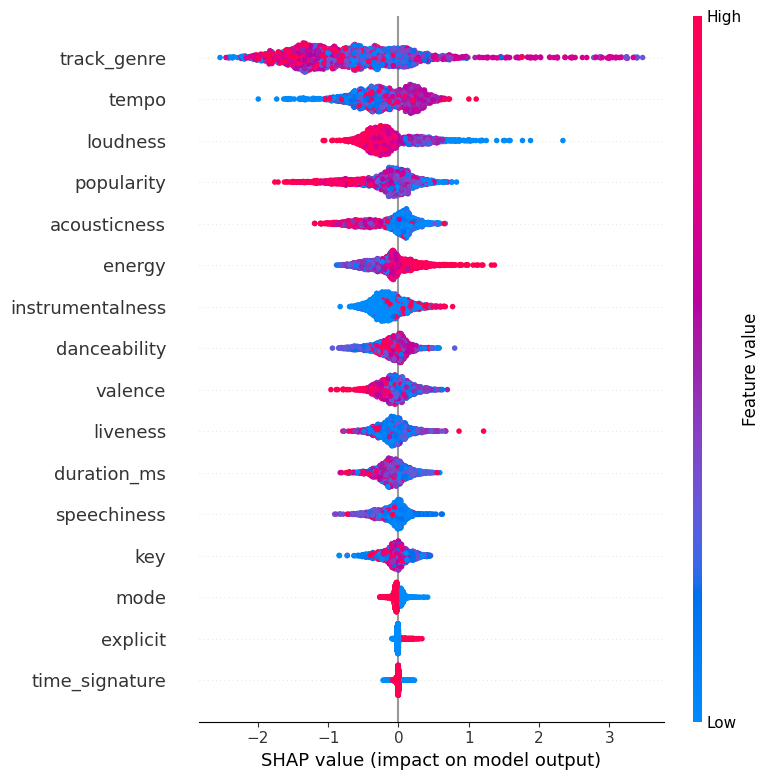

Country: ES


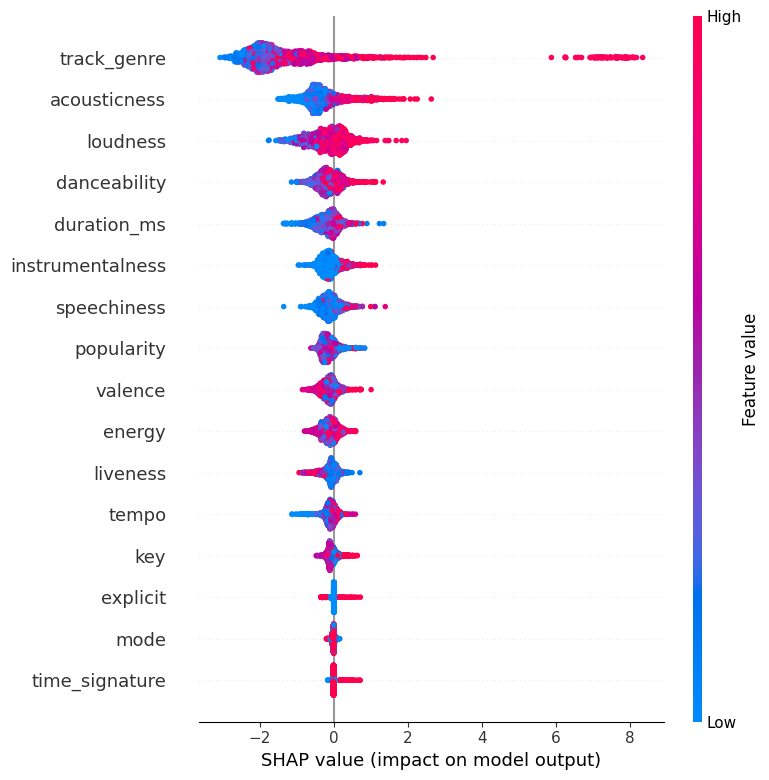

Country: FR


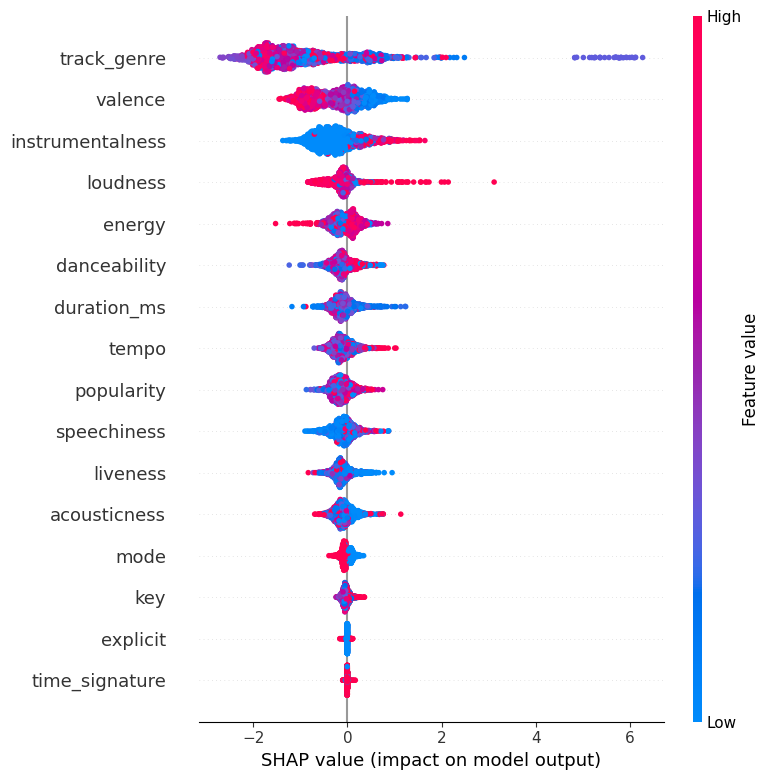

Country: GB


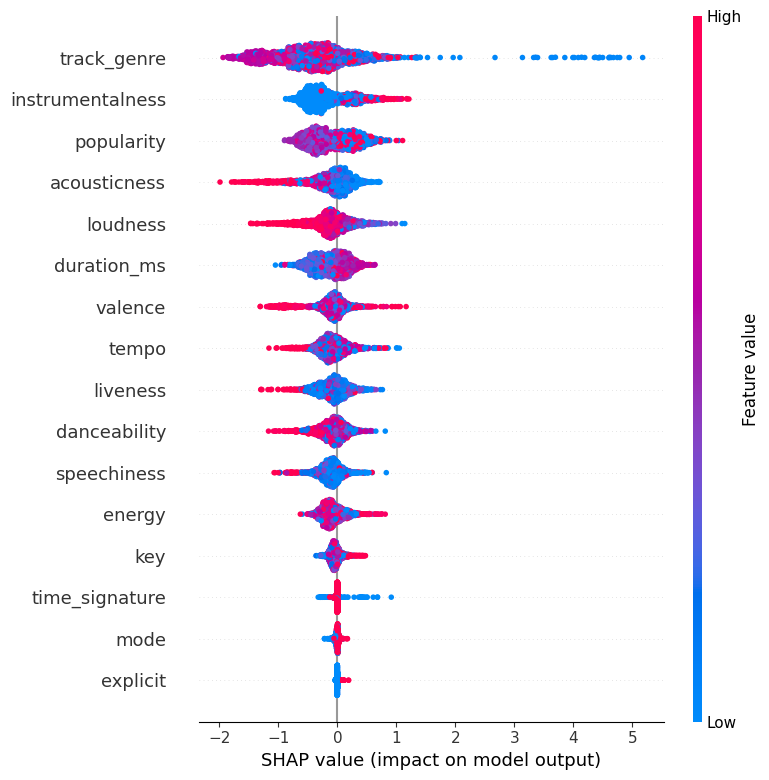

Country: IN


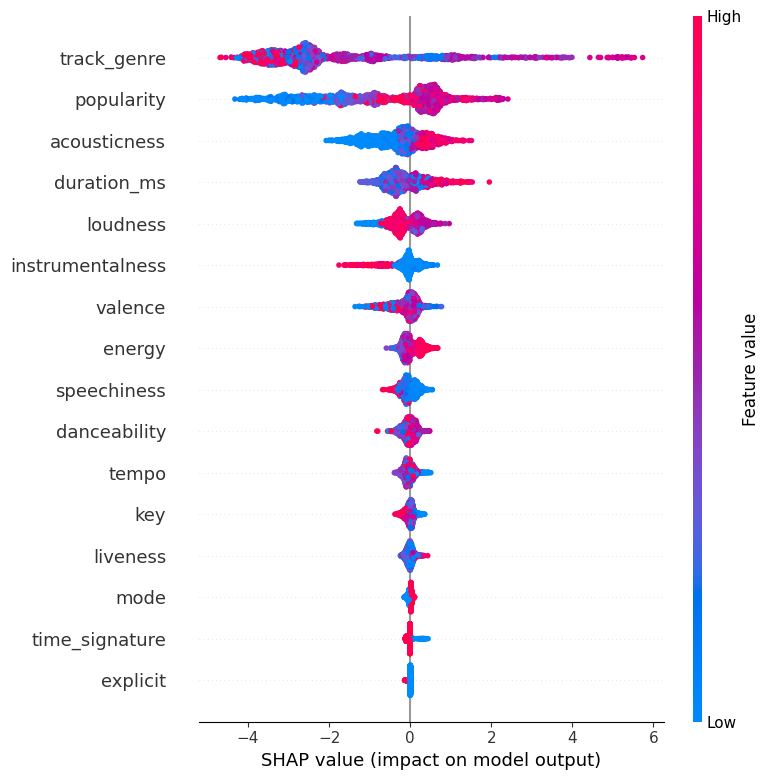

Country: IT


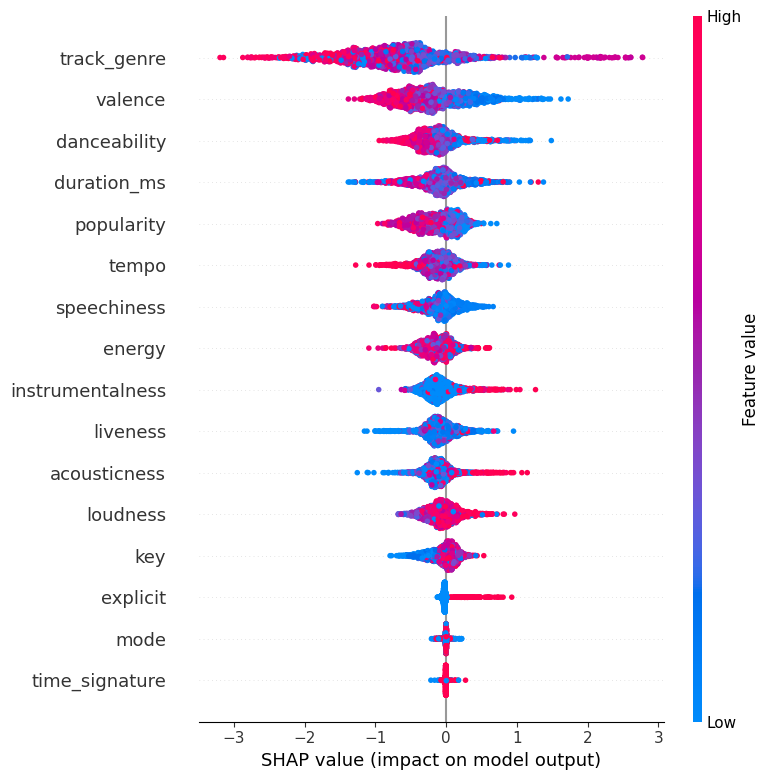

Country: JM


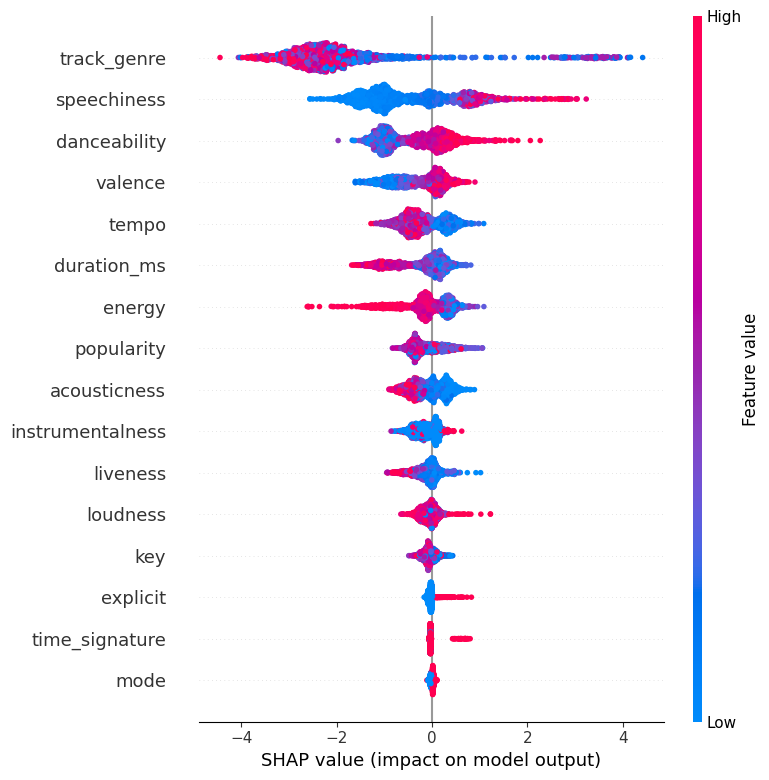

Country: JP


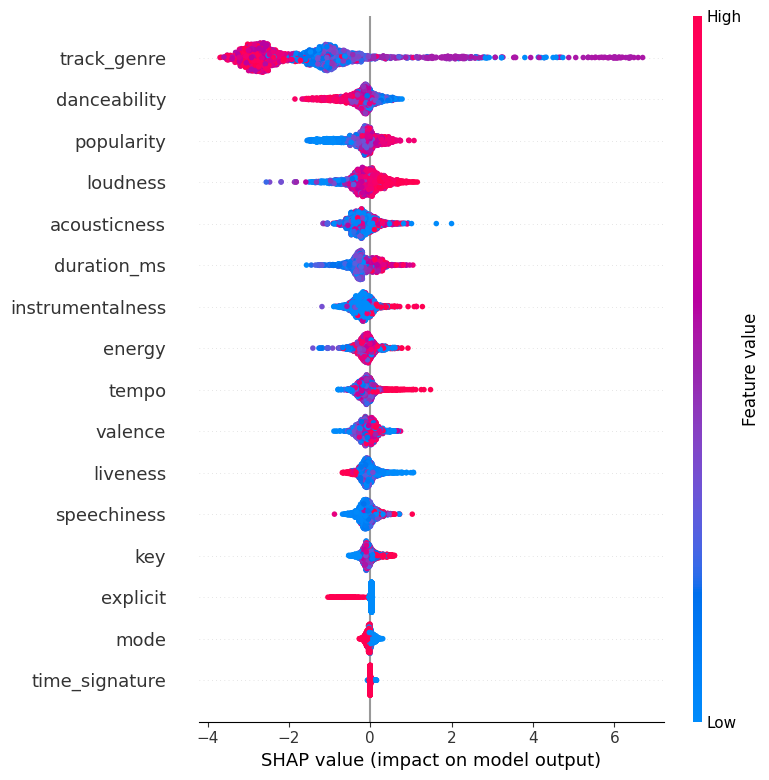

Country: KR


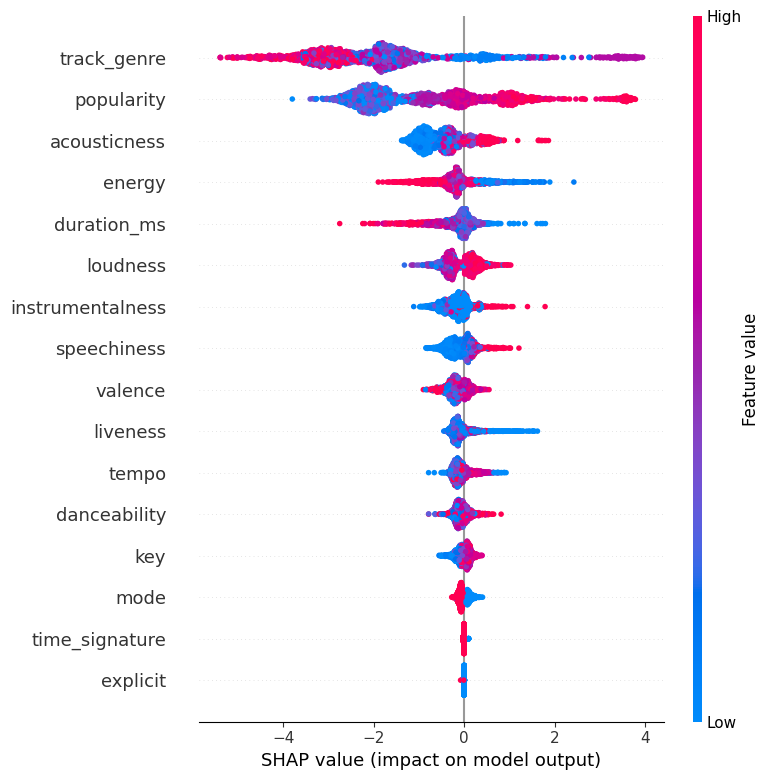

Country: MX


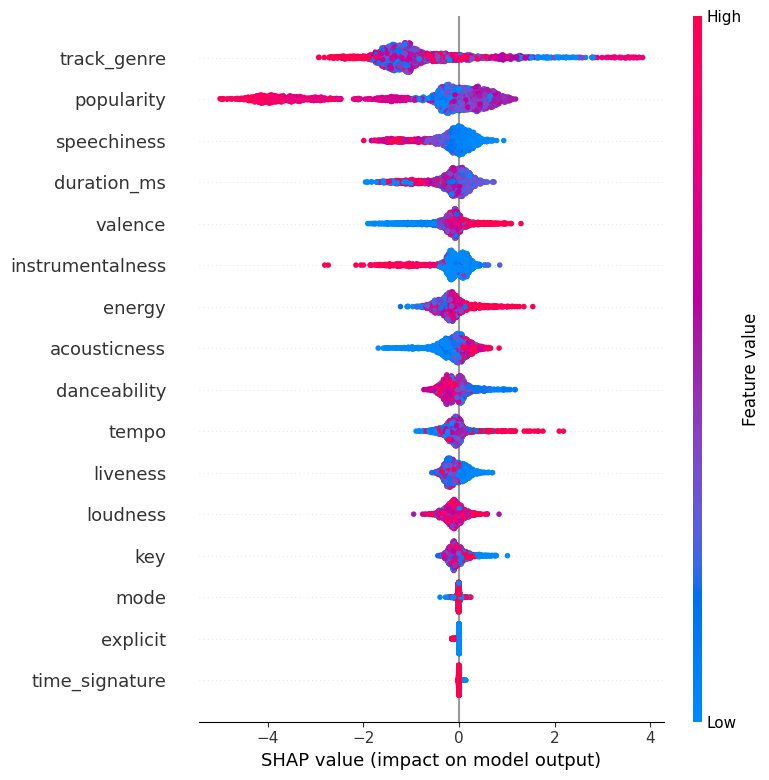

Country: NL


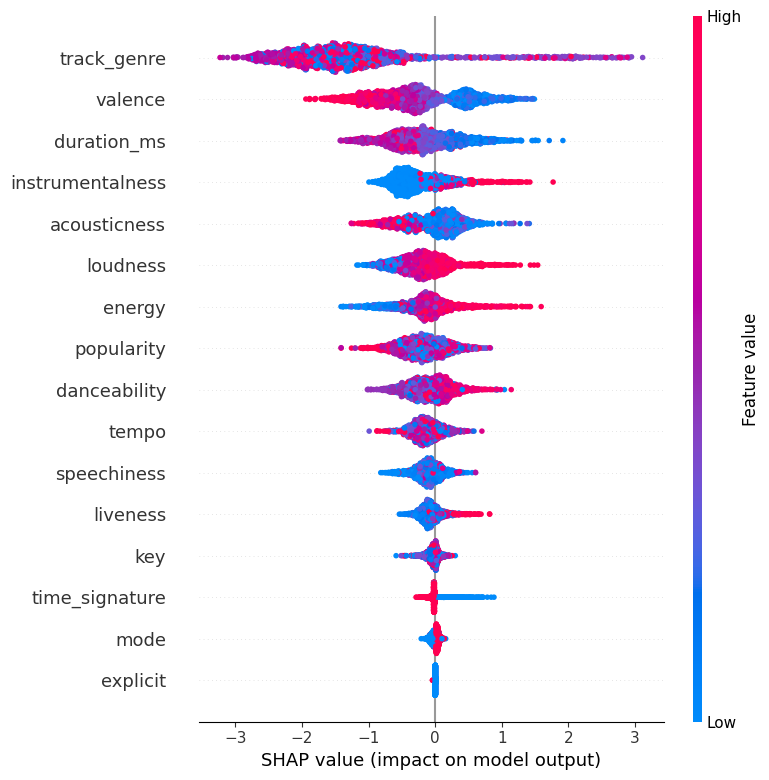

Country: PR


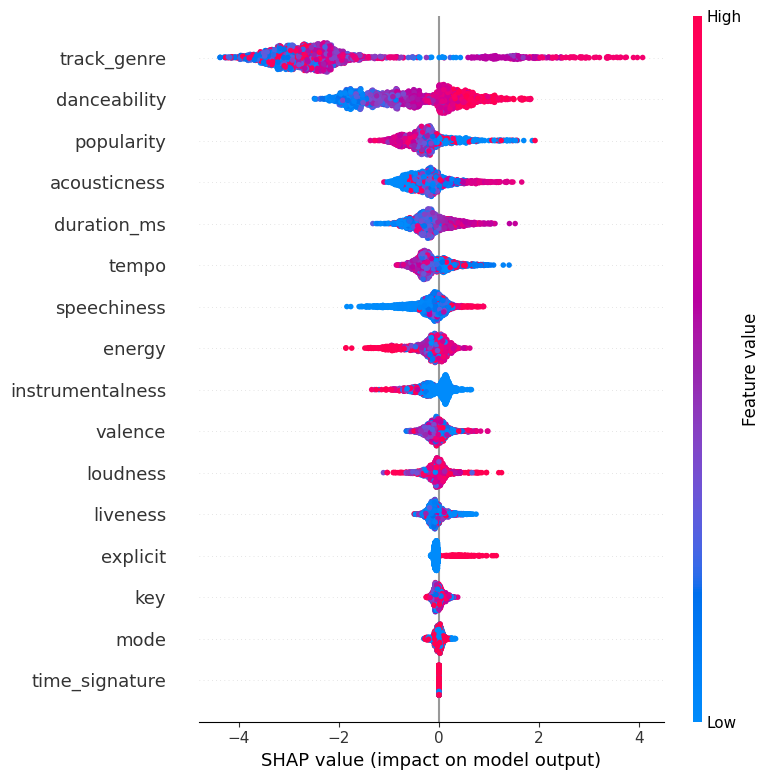

Country: SE


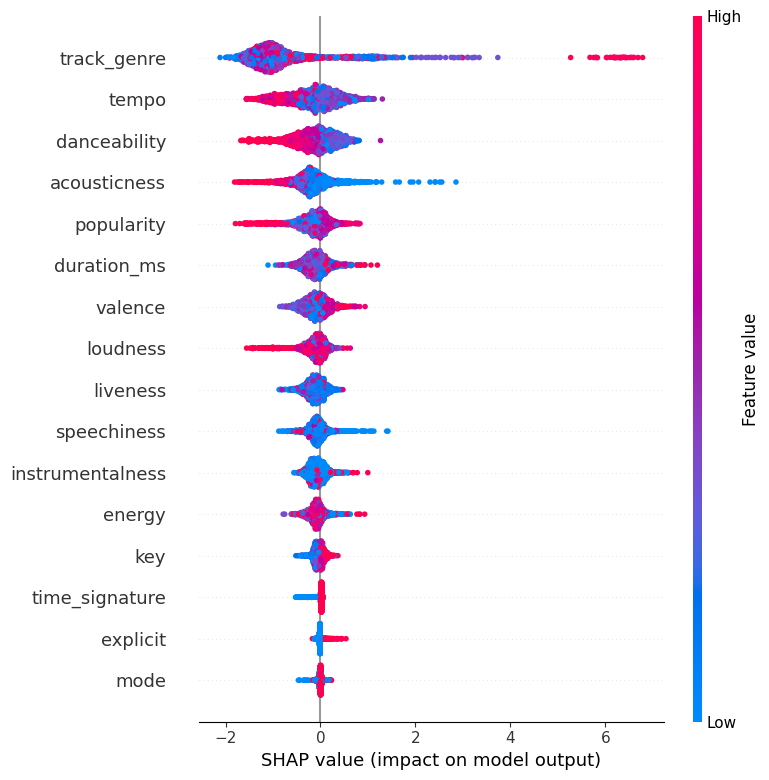

Country: TR


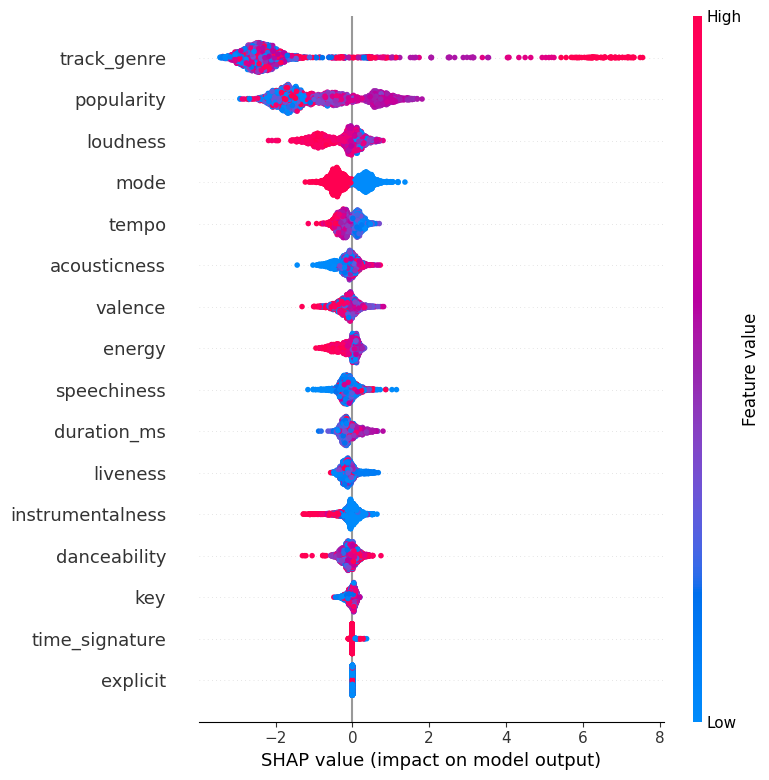

Country: US


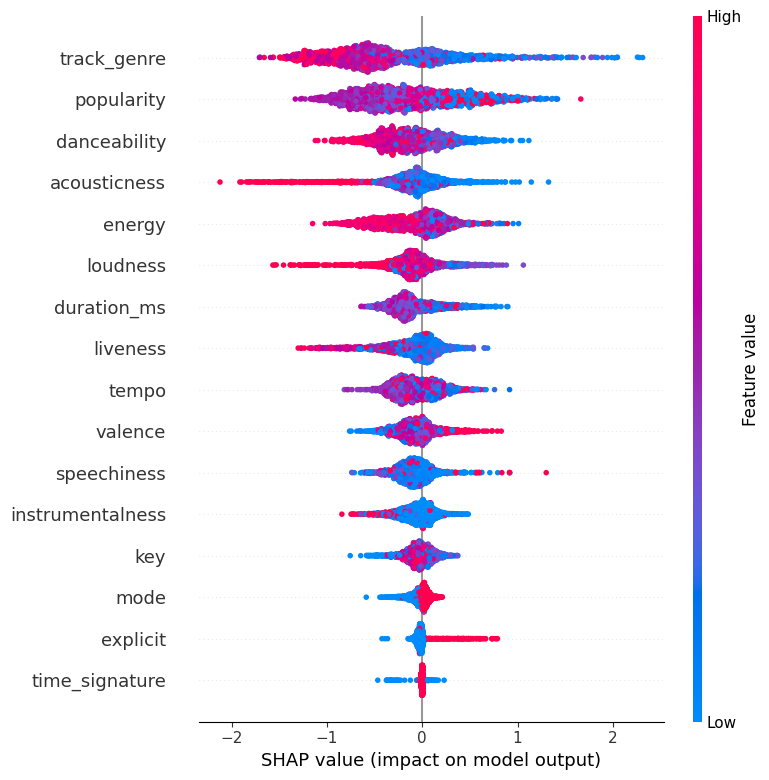

In [119]:
for index, country_code in enumerate(country_label_encoder.classes_):
    print(f"Country: {country_code}")
    shap.summary_plot(shap_values[..., index], X_test)

In [67]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

In [75]:
exp = Explanation(shap_values[:,:,1], 
                  shap_values[:,1], 
                  data=X.values, 
                  feature_names=X.columns)
idx = 0
waterfall(exp[idx])

TypeError: only length-1 arrays can be converted to Python scalars

In [70]:
shap.plots.waterfall(shap_values[0])

TypeError: The waterfall plot requires an `Explanation` object as the `shap_values` argument.

In [69]:
shap.force_plot(explainer.expected_value, shap_values)

TypeError: In v0.20, force plot now requires the base value as the first parameter! Try shap.plots.force(explainer.expected_value, shap_values) or for multi-output models try shap.plots.force(explainer.expected_value[0], shap_values[..., 0]).

In [57]:
print(len(X.iloc[0]))

16


In [61]:
shap_values.shape

(10568, 16, 21)

In [62]:
shap.dependence_plot('track_genre', shap_values, X)

ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 21 and the array at index 1 has size 50

IndexError: index 17 is out of bounds for axis 1 with size 16

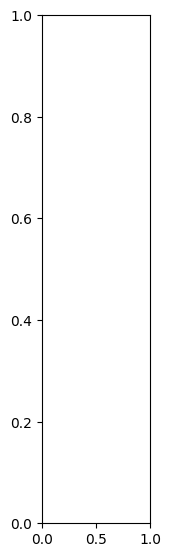

In [63]:
shap.summary_plot(shap_values, X)

In [65]:
shap.plots.waterfall(shap_values[0])

TypeError: The waterfall plot requires an `Explanation` object as the `shap_values` argument.

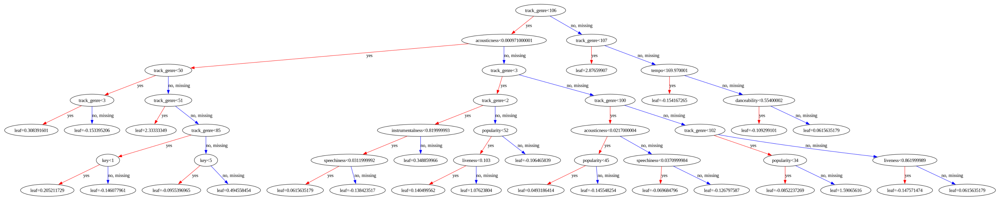

In [122]:
import xgboost as xgb
xgb.plot_tree(model, num_trees=0)
plt.rcParams['figure.figsize'] = [200, 200]
plt.savefig('xgb_tree.png')

In [38]:
import joblib

# model.save_model("models/trackmap.ubj")
joblib.dump(model, "models/model.joblib")
joblib.dump(genre_label_encoder, "models/genre_label_encoder.joblib")
joblib.dump(country_label_encoder, "models/country_label_encoder.joblib")

['models/country_label_encoder.joblib']

In [39]:
song = antijoined_df \
    .filter("track_name = 'Yellow Submarine'") \
    .limit(1) \
    .toPandas()

song["track_genre"] = genre_label_encoder.transform(song["track_genre"])

prediction = model.predict(song.drop(["name", "track_name"], axis=1))

print(f"Predicted country: {country_label_encoder.inverse_transform(prediction)}")

Predicted country: ['GB']


In [93]:
merged_df_without_country = joined_df \
    .drop("country") \
    .union(antijoined_df) \
    .withColumn("track_and_artist", sfn.lower(sfn.concat(sfn.col("name"), sfn.lit(" - "), sfn.col("track_name"))))
merged_df_without_country.persist(StorageLevel.MEMORY_AND_DISK)
print(merged_df_without_country.count())
merged_df_without_country.show(5)
merged_df_without_country.printSchema()

89740
+-----------+--------------------+----------+-----------+--------+------------+------+---+--------+----+-----------+------------+----------------+--------+-------+-------+--------------+-----------+--------------------+
|       name|          track_name|popularity|duration_ms|explicit|danceability|energy|key|loudness|mode|speechiness|acousticness|instrumentalness|liveness|valence|  tempo|time_signature|track_genre|    track_and_artist|
+-----------+--------------------+----------+-----------+--------+------------+------+---+--------+----+-----------+------------+----------------+--------+-------+-------+--------------+-----------+--------------------+
|        AFK|              Clouds|        36|     283689|   false|       0.525| 0.983| 11|  -3.602|   0|      0.206|     1.17E-4|           0.104|  0.0616|  0.286| 176.08|             4|    dubstep|        afk - clouds|
| Amon Tobin|At The End Of The...|        48|     192200|   false|       0.465|  0.78|  8|  -7.064|   1|     0.032

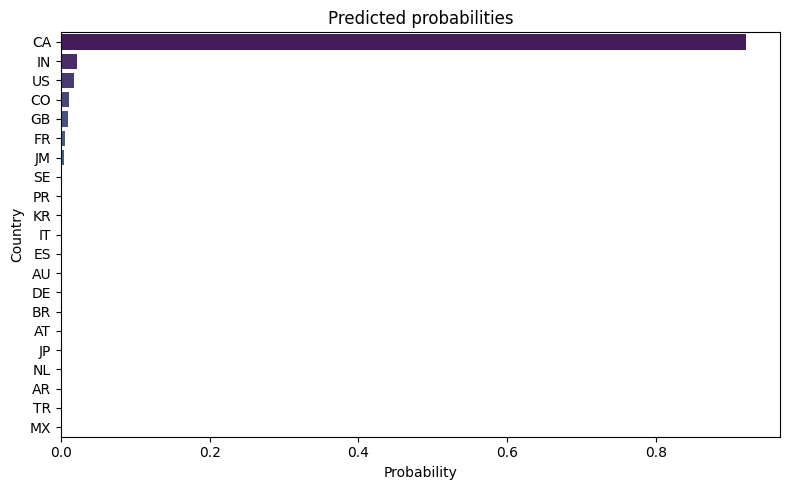

In [88]:
song = merged_df_without_country \
    .filter("track_name = 'Baby'") \
    .orderBy("popularity", ascending=False) \
    .limit(1) \
    .toPandas()

song["track_genre"] = genre_label_encoder.transform(song["track_genre"])

probabilities = model.predict_proba(song.drop(["name", "track_name", "track_and_artist"], axis=1))
probabilities = pd.Series(probabilities[0], index=country_label_encoder.classes_)
probabilities = probabilities.sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=probabilities, y=probabilities.index, palette="viridis", hue=probabilities.index)
plt.title("Predicted probabilities")

plt.xlabel("Probability")
plt.ylabel("Country")

plt.tight_layout()

plt.show()

In [113]:
# Print number of different unique "track_genre" values
print(joined_df.select("track_genre").distinct().count())

113
112


In [94]:
# Save the merged dataset
merged_df_without_country.write.parquet("datasets/processed/merged_df_without_country.parquet")

24/06/07 21:06:36 WARN MemoryManager: Total allocation exceeds 95.00% (1,020,054,720 bytes) of heap memory
Scaling row group sizes to 95.00% for 8 writers
24/06/07 21:06:36 WARN MemoryManager: Total allocation exceeds 95.00% (1,020,054,720 bytes) of heap memory
Scaling row group sizes to 84.44% for 9 writers
24/06/07 21:06:36 WARN MemoryManager: Total allocation exceeds 95.00% (1,020,054,720 bytes) of heap memory
Scaling row group sizes to 76.00% for 10 writers
24/06/07 21:06:36 WARN MemoryManager: Total allocation exceeds 95.00% (1,020,054,720 bytes) of heap memory
Scaling row group sizes to 84.44% for 9 writers
24/06/07 21:06:36 WARN MemoryManager: Total allocation exceeds 95.00% (1,020,054,720 bytes) of heap memory
Scaling row group sizes to 95.00% for 8 writers
24/06/07 21:06:36 WARN MemoryManager: Total allocation exceeds 95.00% (1,020,054,720 bytes) of heap memory
Scaling row group sizes to 95.00% for 8 writers
24/06/07 21:06:36 WARN MemoryManager: Total allocation exceeds 95.00%

{'featurecla': 'Admin-0 country', 'scalerank': 0, 'LABELRANK': 2, 'SOVEREIGNT': 'Indonesia', 'SOV_A3': 'IDN', 'ADM0_DIF': 0, 'LEVEL': 2, 'TYPE': 'Sovereign country', 'TLC': '1', 'ADMIN': 'Indonesia', 'ADM0_A3': 'IDN', 'GEOU_DIF': 0, 'GEOUNIT': 'Indonesia', 'GU_A3': 'IDN', 'SU_DIF': 0, 'SUBUNIT': 'Indonesia', 'SU_A3': 'IDN', 'BRK_DIFF': 0, 'NAME': 'Indonesia', 'NAME_LONG': 'Indonesia', 'BRK_A3': 'IDN', 'BRK_NAME': 'Indonesia', 'BRK_GROUP': '', 'ABBREV': 'Indo.', 'POSTAL': 'INDO', 'FORMAL_EN': 'Republic of Indonesia', 'FORMAL_FR': '', 'NAME_CIAWF': 'Indonesia', 'NOTE_ADM0': '', 'NOTE_BRK': '', 'NAME_SORT': 'Indonesia', 'NAME_ALT': '', 'MAPCOLOR7': 6, 'MAPCOLOR8': 6, 'MAPCOLOR9': 6, 'MAPCOLOR13': 11, 'POP_EST': 270625568.0, 'POP_RANK': 17, 'POP_YEAR': 2019, 'GDP_MD': 1119190, 'GDP_YEAR': 2019, 'ECONOMY': '4. Emerging region: MIKT', 'INCOME_GRP': '4. Lower middle income', 'FIPS_10': 'ID', 'ISO_A2': 'ID', 'ISO_A2_EH': 'ID', 'ISO_A3': 'IDN', 'ISO_A3_EH': 'IDN', 'ISO_N3': '360', 'ISO_N3_EH': 

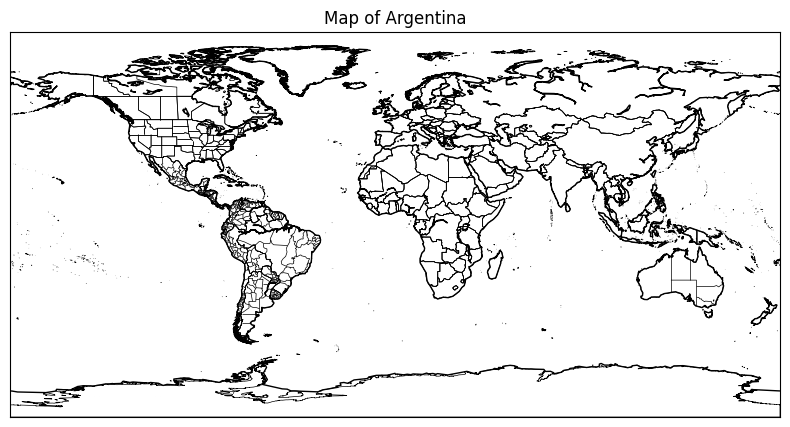

In [109]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

def plot_country(country_code):
    # Create a new map with Basemap
    plt.figure(figsize=(10, 5))
    map = Basemap()

    # Draw coastlines, countries, and states
    map.drawcoastlines()
    map.drawcountries()
    map.drawstates()

    # Read shapefile with country borders
    map.readshapefile('datasets/ne_10m_admin_0_countries', 'countries')

    # Find and plot the country with the given country code
    for country_info, country_shape in zip(map.countries_info, map.countries):
        print(country_info)
        if country_info['SOV_A3'] == country_code:
            x, y = zip(*country_shape)
            map.fillcontinents(color='lightgray', lake_color='aqua')
            plt.fill(x, y, 'r')  # Color the country with red ('r')

    # Show the plot
    plt.title(f'Map of {country_code}')
    plt.show()

# Example usage: Plotting Germany ('DE')
plot_country('Argentina')